In [1]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.font_manager as font_manager
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from collections import defaultdict
import re
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def regressao_linear(x, y):
    # Verifique se as entradas têm o mesmo tamanho
    if len(x) != len(y):
        raise ValueError("As listas de entrada devem ter o mesmo tamanho.")

    # Converta as listas em arrays do numpy
    x = np.array(x).reshape(-1, 1)
    y = np.array(y)

    # Crie um modelo de regressão linear
    modelo = LinearRegression()

    # Treine o modelo
    modelo.fit(x, y)

    # Faça previsões com base no modelo treinado
    y_pred = modelo.predict(x)

    # Calcule o coeficiente de determinação (R²)
    r2 = r2_score(y, y_pred)

    # Retorne os coeficientes da regressão e o R²
    return modelo.coef_[0], modelo.intercept_,r2

def ava_sizes(ts_DF):
    for ts, df in sorted(ts_DF.items()):
        print('avalanches for ts : %d' % ts)
        with open('ava_%d.dat' % ts, 'w') as fid:
            # Assuming 'num_deleted_rods' is a column in your DataFrame
            lista = np.array(df['num_deleted_rods'])
            lista_sem_zeros = [x for x in lista if x != 0]
            
            nl = [lista_sem_zeros[0]]
            for i in range(1, len(lista_sem_zeros)):
                nl.append(lista_sem_zeros[i] - lista_sem_zeros[i-1])

            nl_sem_zeros = [x for x in nl if x != 0]
            for i in nl_sem_zeros:
                fid.write('%d\n' % i)


cmap = plt.get_cmap('inferno')
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=cmap(np.linspace(0, 1, 12)))
markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H', 'h']

plt.rcParams['text.usetex'] = True
#plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=17)
plt.rc('lines', markersize=6)
plt.rc('lines', linewidth=2)
plt.rc('legend', loc='best')
plt.rc('legend', fontsize=8)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('font', family='serif')


/tmp/ipykernel_180303/2720352955.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
##### Read files and create dict

# Crie um dicionário para armazenar listas de 'df' por 'ts'
ts_df = defaultdict(list)

#path = r'C:\Users\55859\Datas\Stress_carmona'
path = '/home/robert/Datas/Stress_carmona/'
for fn in tqdm(sorted(os.listdir(path))):
    if not fn.endswith('.txt'):
        continue    
    
    file_path = os.path.join(path, fn)

    with open(file_path, 'r') as file:
        lines = file.readlines()

    data_frames = {}
    current_df = None

    # Extract the column names
    column_names = ['F','num_particles','num_deleted_particles','num_deleted_rods']

    # Define a regular expression pattern to match "ts_" followed by one or more digits
    pattern = r'ts_(\d+)'

    # Use re.findall() to find all matches in the file path
    numbers_after_ts = [match for match in re.findall(pattern, file_path)]

    ts = int(numbers_after_ts[0])

    # Iterate through the lines in the file (starting from the second line)
    for line in lines[1:]:
        line = line.strip()
        if line.startswith('-'):
            # This is a separator line; the following line contains the name of the DF
            current_df = line.lstrip('-').strip()
        elif line:
            # This line contains data for the current DF
            data = line.split(',')
            if current_df not in data_frames:
                data_frames[current_df] = {
                    'columns': column_names,
                    'data': []
                }
            data_frames[current_df]['data'].append(data)

    # Process each data frame ]
    for df_name, df_data in data_frames.items():
        df = pd.DataFrame(df_data['data'], columns=column_names)
        df['num_deleted_rods'] = pd.to_numeric(df['num_deleted_rods'], errors='coerce', downcast='integer')
        df['num_deleted_particles'] = pd.to_numeric(df['num_deleted_particles'], errors='coerce', downcast='integer')
        df['num_particles'] = pd.to_numeric(df['num_particles'], errors='coerce')
        df['F'] = pd.to_numeric(df['F'], errors='coerce')

        ts_df[ts].append(df)



  0%|          | 0/109 [00:00<?, ?it/s]

100%|██████████| 109/109 [06:26<00:00,  3.54s/it]


In [3]:
##### Create a unique df for each ts

ts_DF = {}
for ts in ts_df.keys():
    dfs = []
    for i in range(len(ts_df[ts])):
        df = ts_df[ts][i]
        dfs.append(df)

    #print(dfs)
    df_conc = pd.concat(dfs, ignore_index=True)
    ts_DF[ts] = df_conc
    

In [4]:
##### fix for ts 8 files

df = ts_DF[8]
# Drop rows with NaN values
df.dropna(inplace=True)

# Reset index
df.reset_index(drop=True, inplace=True)
ts_DF[8] = df


In [21]:
ts_DF[8]['num_deleted_rods'].to_list()

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 2.0,
 3.0,
 3.0,
 3.0,
 4.0,
 4.0,
 5.0,
 6.0,
 6.0,
 6.0,
 6.0,
 7.0,
 7.0,
 7.0,
 7.0,
 7.0,
 8.0,
 8.0,
 8.0,
 8.0,
 10.0,
 11.0,
 12.0,
 12.0,
 12.0,
 12.0,
 14.0,
 14.0,
 14.0,
 14.0,
 14.0,
 14.0,
 14.0,
 14.0,
 15.0,
 15.0,
 17.0,
 17.0,
 19.0,
 19.0,
 19.0,
 19.0,
 24.0,
 34.0,
 34.0,
 39.0,
 39.0,
 39.0,
 42.0,
 46.0,
 46.0,
 46.0,
 46.0,
 54.0,
 63.0,
 63.0,
 63.0,
 75.0,
 95.0,
 102.0,
 106.0,
 106.0,
 107.0,
 107.0,
 115.0,
 115.0,
 117.0,
 121.0,
 121.0,
 121.0,
 121.0,
 121.0,
 124.0,
 124.0,
 124.0,
 127.0,
 130.0,
 131.0,
 131.0,
 131.0,
 133.0,
 151.0,
 152.0,
 158.0,
 158.0,
 168.0,
 168.0,
 168.0,
 172.0,
 173.0,
 173.0,
 182.0,
 182.0,
 182.0,
 182.0,
 184.0,
 184.0,
 186.0,
 189.0,
 194.0,
 194.0,
 194.0,
 194.0,
 199.0,
 205.0,
 207.0,
 207.0,
 216.0,
 216.0,
 217.0,
 217.0,
 226.0,
 231.0,
 231.0,
 235.0,
 240.0,
 240.0,
 241.0,
 246.0,
 247.0,
 250.0,
 256.0,
 257.0,
 260.

In [5]:
##### Check for has nan values in dfs

df = ts_DF[8]
# Verificando a presença de NaN
nan_mask = df.isna()

# Contando NaN em cada coluna
nan_count = df.isna().sum()

# Verificando se há algum NaN no DataFrame
has_nan = df.isna().any().any()

# Visualizando linhas com NaN
rows_with_nan = df[df.isna().any(axis=1)]

# Imprimindo os resultados
print("Máscara de NaN:\n", nan_mask)
print("\nContagem de NaN por coluna:\n", nan_count)
print("\nHá NaN no DataFrame:", has_nan)
print("\nLinhas com NaN:\n", rows_with_nan)

Máscara de NaN:
              F  num_particles  num_deleted_particles  num_deleted_rods
0        False          False                  False             False
1        False          False                  False             False
2        False          False                  False             False
3        False          False                  False             False
4        False          False                  False             False
...        ...            ...                    ...               ...
1614928  False          False                  False             False
1614929  False          False                  False             False
1614930  False          False                  False             False
1614931  False          False                  False             False
1614932  False          False                  False             False

[1614933 rows x 4 columns]

Contagem de NaN por coluna:
 F                        0
num_particles            0
num_deleted_particl

In [80]:
##### For check the number of avalanches in the process 

ava_sizes(ts_DF)

avalanches for ts : 2
avalanches for ts : 8
avalanches for ts : 16
avalanches for ts : 32
avalanches for ts : 64
avalanches for ts : 128
avalanches for ts : 512
avalanches for ts : 1024
avalanches for ts : 4096
avalanches for ts : 8192
avalanches for ts : 10000


[50.5, 76.5, 103.5, 140.5, 172.0, 188.5, 202.5, 204.0, 205.5, 207.5, 209.0]


<function matplotlib.pyplot.show(close=None, block=None)>

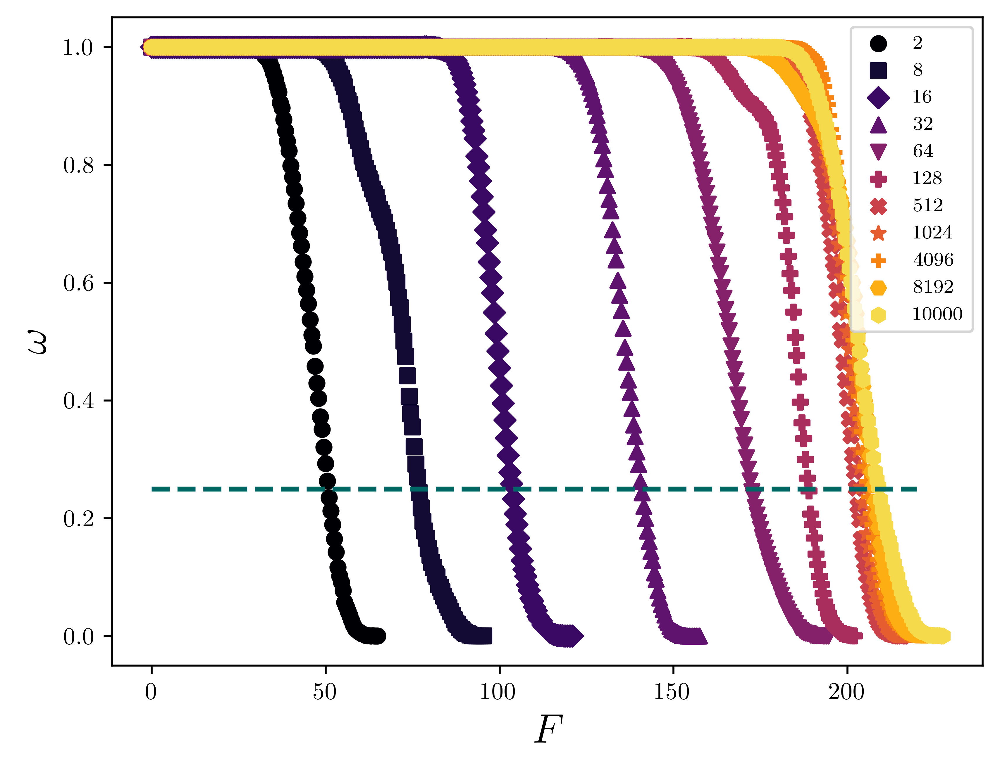

In [6]:
##### Check the frequence of forces for cut the data

cut = []
plt.figure(dpi = 600)
marker_index = 0
for ts in sorted(ts_DF):
    df = ts_DF[ts]
    Force, f = np.unique(df['F'], return_counts=True)
    f = f/f[0]

    plt.scatter(Force, f, marker=markers[marker_index], label=ts)
    marker_index = (marker_index + 1) % len(markers)  # Incrementar e ciclar pelo markers
    
    # Inicializar uma variável para armazenar temporariamente o último valor que satisfaz a condição
    last_value_meeting_condition = None

    # Verificar quais frequências são >= 0.25
    for i in range(len(f)):
        if f[i] >= 0.25:
            last_value_meeting_condition = Force[i]

    # Se um valor foi encontrado, adicione-o ao vetor cut
    if last_value_meeting_condition is not None:
        cut.append(last_value_meeting_condition)
    
# Imprimir o vetor cut para verificar
print(cut)
x = np.linspace(0,220,220)
y = np.ones(220)*0.25

plt.plot(x,y,'--',color='#006666')
plt.xlabel(r'$F$')
plt.ylabel(r'$\omega$')
plt.legend(loc = 'best')
plt.show


In [7]:
##### Dict with df mean for each ts 

ts_DFM = {}
for ts in sorted(ts_DF):
    
    ts_DFM[ts] = ts_DF[ts].groupby('F').mean().reset_index()
    ts_DFM[ts]['num_deleted_rods'] = ts_DFM[ts]['num_deleted_rods'].astype(int)
    ts_DFM[ts]['num_particles'] = ts_DFM[ts]['num_particles'].astype(int)

#ts_DFM

In [8]:
##### Calc the mean of values and cut

for data,c in zip(ts_DFM,cut):
    ts_DFM[data] = ts_DFM[data][ts_DFM[data]["F"] <= c]

    ## Extend num_delete_rods
    ts_DFM[data]['num_deleted_rods'] =  ts_DFM[data]['num_deleted_rods'] *18
    ts_DFM[data]['num_deleted_rods'] = ts_DFM[data]['num_deleted_rods'].astype(int)

    ## Normalize num particles
    ts_DFM[data]['num_particles_norm'] = ts_DFM[data]['num_particles']/ts_DFM[data]['num_particles'].max()

    ## Set zero in last line
    # Crie uma linha com valores escalares em um DataFrame
    line = pd.DataFrame({'F': [list(ts_DFM[data]['F'])[-1]],
                        'num_particles': [0],
                        'num_deleted_rods': [ts_DFM[data]['num_particles'][0]],
                        'num_particles_norm': [0]})

    # Use o método concat para adicionar a nova linha ao DataFrame
    ts_DFM[data] = pd.concat([ts_DFM[data], line], ignore_index=True)

In [9]:
### For convert to real force, you need to convert to strain and use a factor:

fcc = 0.3*(10**(-9))
dia_m = 1.5*(10**(-9))
A = np.loadtxt('/home/robert/dla-collagen/Rs.dat')
R = np.round(A[:,1],2)*dia_m

In [30]:
R

array([4.8600e-08, 4.3020e-08, 3.6945e-08, 3.2520e-08, 2.6400e-08,
       2.4090e-08, 2.1105e-08, 2.1210e-08, 2.1090e-08, 2.1240e-08,
       2.0925e-08])

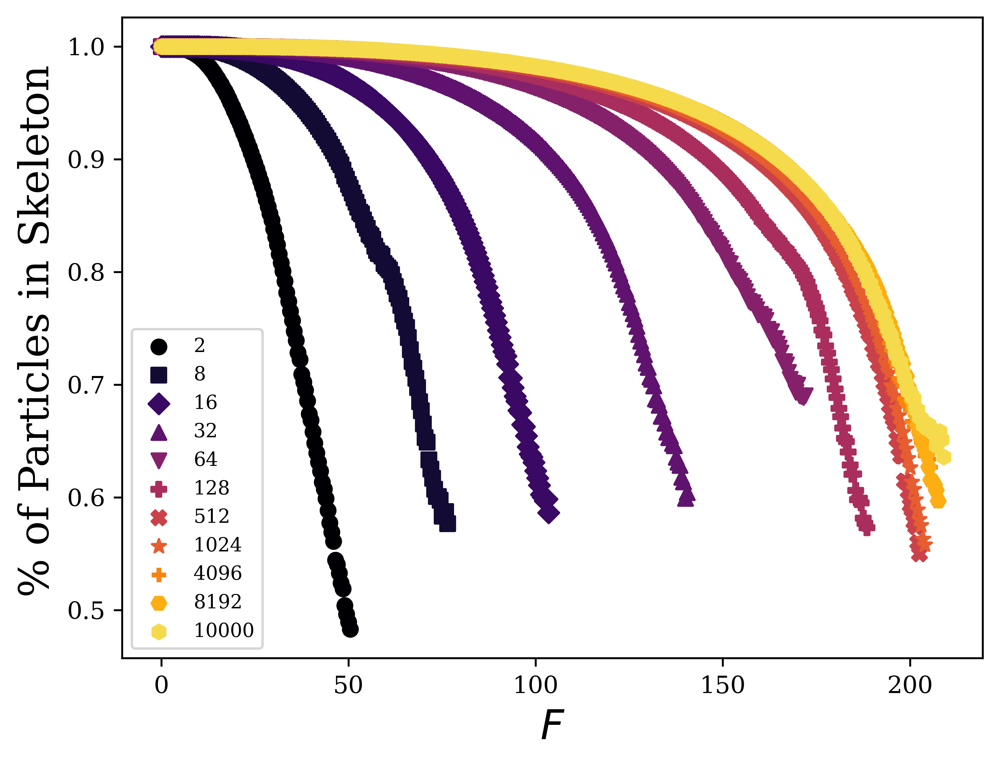

In [18]:
plt.figure(dpi = 600)
plt.ylabel(r' % of Particles in Skeleton')
plt.xlabel(r"$F$")
i = 0
a = []
for ts, df in ts_DFM.items():
    
    y = df['num_particles_norm'].to_numpy()[:-1]
    x = df['F'].to_numpy()[:-1]
    #print(x[-1])
    a.append(x[-1])
    plt.scatter(x,y ,marker = markers[i], label = ts)
    

    i+= 1
a = np.array(a)
plt.legend()

In [32]:
R**2

array([2.36196000e-15, 1.85072040e-15, 1.36493303e-15, 1.05755040e-15,
       6.96960000e-16, 5.80328100e-16, 4.45421025e-16, 4.49864100e-16,
       4.44788100e-16, 4.51137600e-16, 4.37855625e-16])

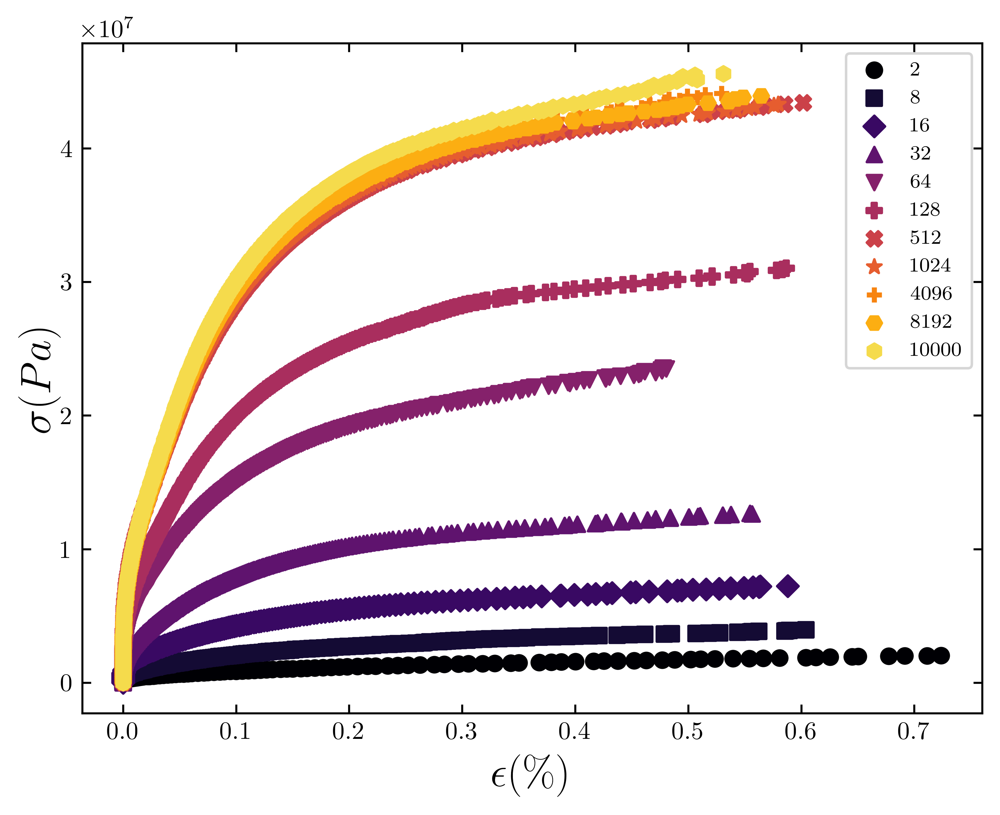

In [25]:
plt.figure(dpi=600)
plt.xlabel(r'$\epsilon (\%)$')
plt.ylabel('$\sigma(Pa)$', rotation = 90, labelpad=0)
i = 0
a = []
sig = []
for ts, df in ts_DFM.items():

    x = df['num_deleted_rods'].to_numpy()[:-1]
    x = x/int(df['num_deleted_rods'].max())
    y = df['F'].to_numpy()[:-1]*fcc/(np.pi*(R[i]**2))
    #print(x[-1])
    #a.append(x[-1])
    sig.append(y.max())
    plt.scatter(x,y ,marker = markers[i], label = ts)
    i+= 1

#a = np.array(a)
    
# Configurar os tracinhos para dentro e desativar os labels superior e direito
plt.tick_params(direction='in', top=True, right=True, labeltop=False, labelright=False)
plt.legend()

In [33]:
y

array([       0.        ,   109046.17915453,   218092.35830906,
         327138.53746359,   436184.71661812,   545230.89577265,
         654277.07492718,   763323.25408171,   872369.43323624,
         981415.61239077,  1090461.7915453 ,  1199507.97069983,
        1308554.14985436,  1417600.32900889,  1526646.50816342,
        1635692.68731795,  1744738.86647248,  1853785.04562701,
        1962831.22478154,  2071877.40393607,  2180923.58309059,
        2289969.76224513,  2399015.94139965,  2508062.12055418,
        2617108.29970871,  2726154.47886324,  2835200.65801777,
        2944246.8371723 ,  3053293.01632683,  3162339.19548136,
        3271385.37463589,  3380431.55379042,  3489477.73294495,
        3598523.91209948,  3707570.09125401,  3816616.27040854,
        3925662.44956307,  4034708.6287176 ,  4143754.80787213,
        4252800.98702666,  4361847.16618119,  4470893.34533572,
        4579939.52449025,  4688985.70364478,  4798031.88279931,
        4907078.06195384,  5016124.24110

In [35]:
sig

[2041691.9743282814,
 3947226.11147421,
 7241030.72090786,
 12686640.468999656,
 23566331.105204877,
 31017667.529270697,
 43413589.61594881,
 43303222.09406793,
 44119445.828768104,
 43921833.19444215,
 45581302.88659344]

<Figure size 900x900 with 0 Axes>

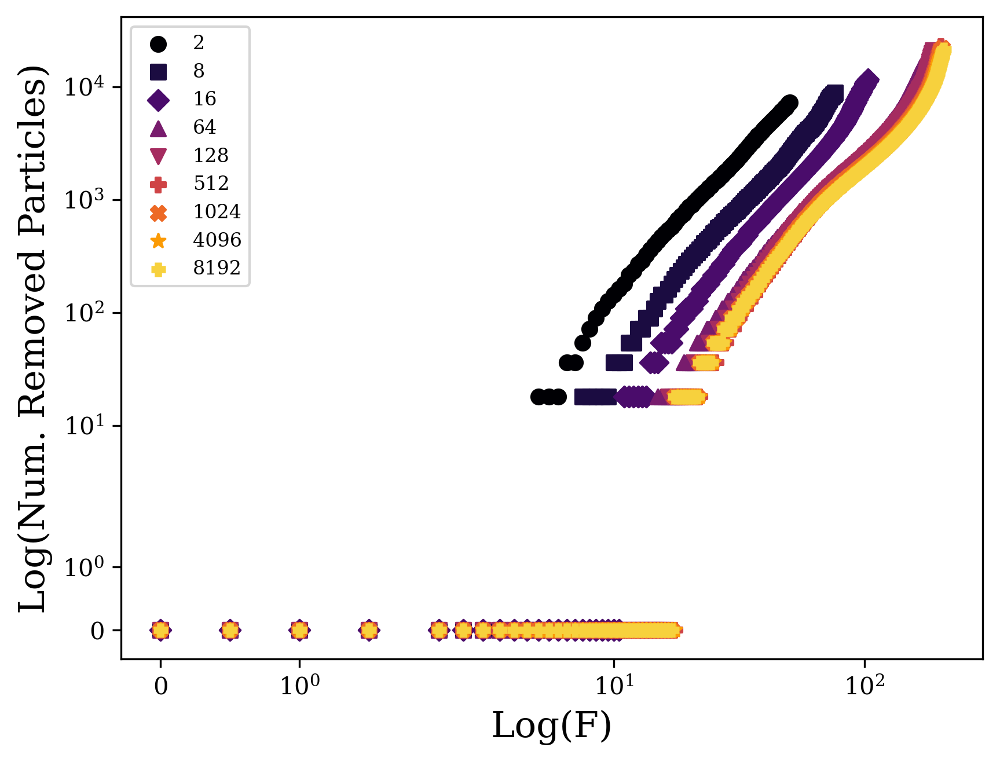

In [42]:

plt.figure(dpi=300)
markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H']
plt.ylabel(r'Log(Num. Removed Particles)')
plt.xlabel(r"Log(F)")
i = 0
a = []
for ts, df in ts_DFM.items():
    y = df['num_deleted_rods'].to_numpy()[:-1]
    x = df['F'].to_numpy()[:-1]
    #print(x[-1])
    #a.append(x[-1])
    plt.scatter(x,y ,marker = markers[i], label = ts)
    i+= 1

#a = np.array(a)
plt.xscale('symlog')
plt.yscale('symlog')
plt.legend()

IndexError: list index out of range

<Figure size 900x900 with 0 Axes>

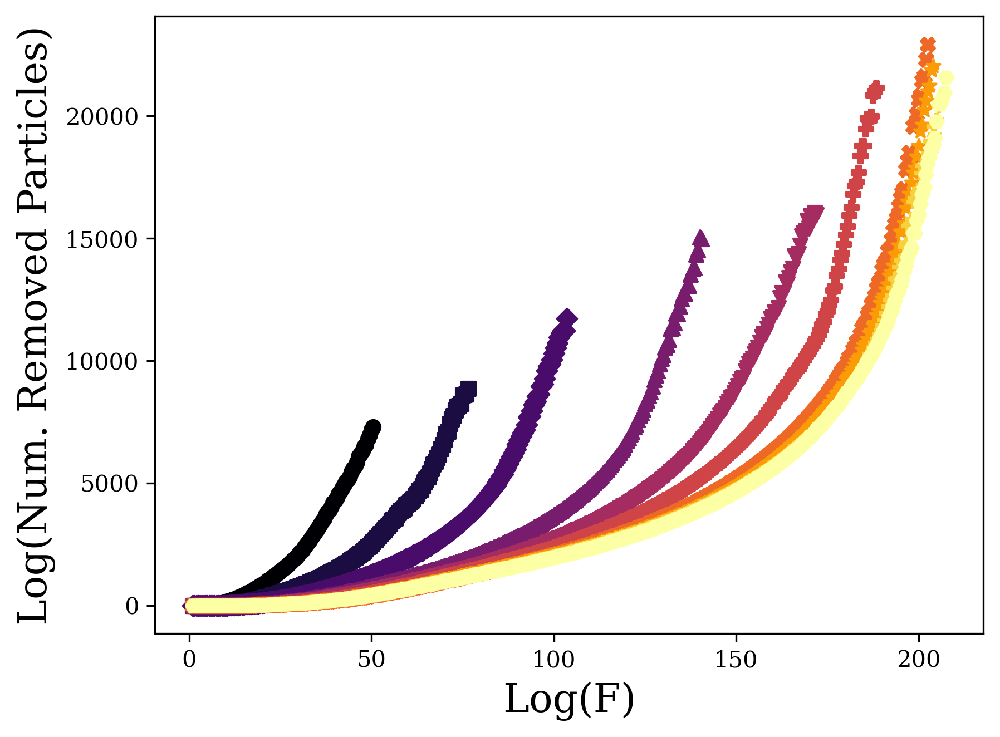

In [86]:
cmap = plt.get_cmap('inferno')
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=cmap(np.linspace(0, 1, 10)))
plt.figure(figsize=(9,9))
plt.figure(dpi=300)
markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H']
plt.ylabel(r'Log(Num. Removed Particles)')
plt.xlabel(r"Log(F)")
i = 0
a = []
for ts, df in ts_DFM.items():

    #if i == 5:
        #break
    y = df['num_deleted_rods'].to_numpy()[2:-1]
    x = df['F'].to_numpy()[2:-1]
    plt.scatter(x,y ,marker = markers[i], label = ts)
    i+= 1
plt.xscale('log')
plt.yscale('log')
plt.legend()

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def regressao_linear(x, y):
    # Verifique se as entradas têm o mesmo tamanho
    if len(x) != len(y):
        raise ValueError("As listas de entrada devem ter o mesmo tamanho.")

    # Converta as listas em arrays do numpy
    x = np.array(x).reshape(-1, 1)
    y = np.array(y)

    # Crie um modelo de regressão linear
    modelo = LinearRegression()

    # Treine o modelo
    modelo.fit(x, y)

    # Faça previsões com base no modelo treinado
    y_pred = modelo.predict(x)

    # Calcule o coeficiente de determinação (R²)
    r2 = r2_score(y, y_pred)

    # Retorne os coeficientes da regressão e o R²
    return modelo.coef_[0], modelo.intercept_,r2
    

/tmp/ipykernel_15927/112579668.py:14: RuntimeWarning: divide by zero encountered in log10
  y = np.log10(df['num_deleted_rods'].to_numpy()[3:-1])


ValueError: Input y contains infinity or a value too large for dtype('float64').

<Figure size 900x900 with 0 Axes>

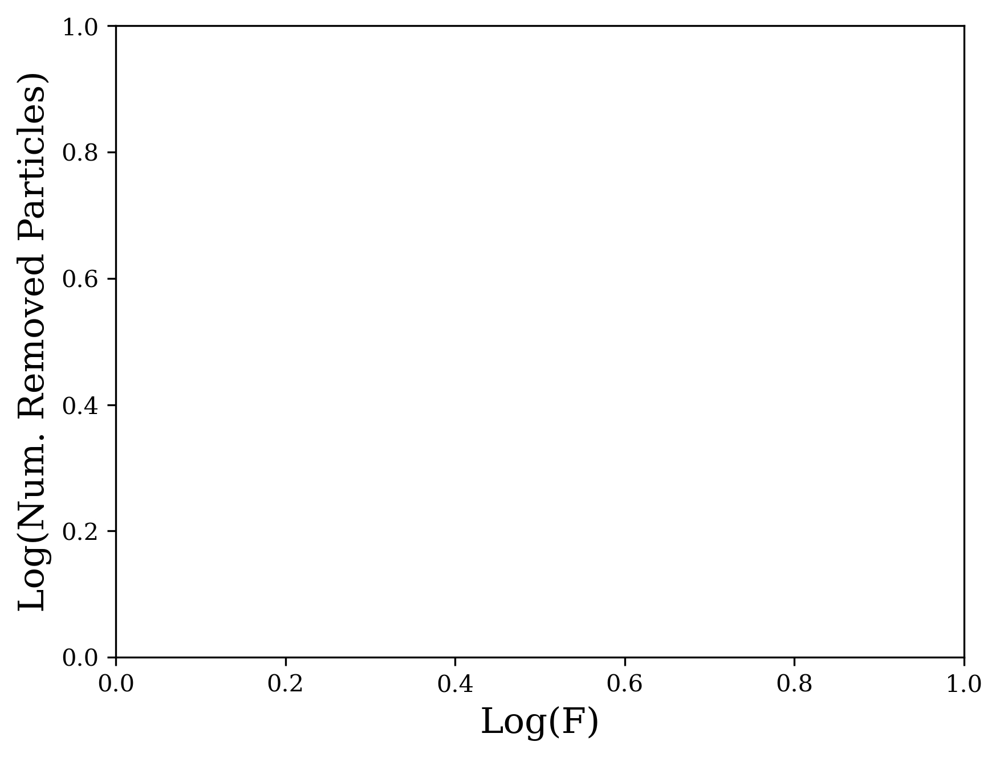

In [45]:
cmap = plt.get_cmap('inferno')
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=cmap(np.linspace(0, 1, 10)))
plt.figure(figsize=(9,9))
plt.figure(dpi=300)
markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H']
plt.ylabel(r'Log(Num. Removed Particles)')
plt.xlabel(r"Log(F)")
i = 0
Betas = []
for ts, df in ts_DFM.items():

    #if i == 5:
        #break
    y = np.log10(df['num_deleted_rods'].to_numpy()[3:-1])
    x = np.log10(df['F'].to_numpy()[3:-1])
    alpha, beta, r2 = regressao_linear(x,y)
    print(f"Ts =  {ts}:")
    print(f"Alpha: {alpha}")
    print(f"Beta: {beta}")
    print(f"R^2: {r2}")
    yreg = alpha*x + beta
    Betas.append(beta)
    plt.plot(x, yreg, linewidth = 4)
    plt.scatter(x,y ,marker = markers[i], label = ts)
    i+= 1
#plt.xscale('log')
#plt.yscale('log')
plt.legend()

In [ ]:
np.savetxt('betas.txt', Betas, fmt = '%f')

In [20]:
fc = []
Ts = []
for ts, df in ts_DFM.items():
    fc.append(df['F'][:-1].max()),
    Ts.append(ts)

fc

[50.5, 76.5, 103.5, 140.5, 172.0, 188.5, 202.5, 204.0, 205.5, 207.5, 209.0]

Text(0, 0.5, '$F_{c}$')

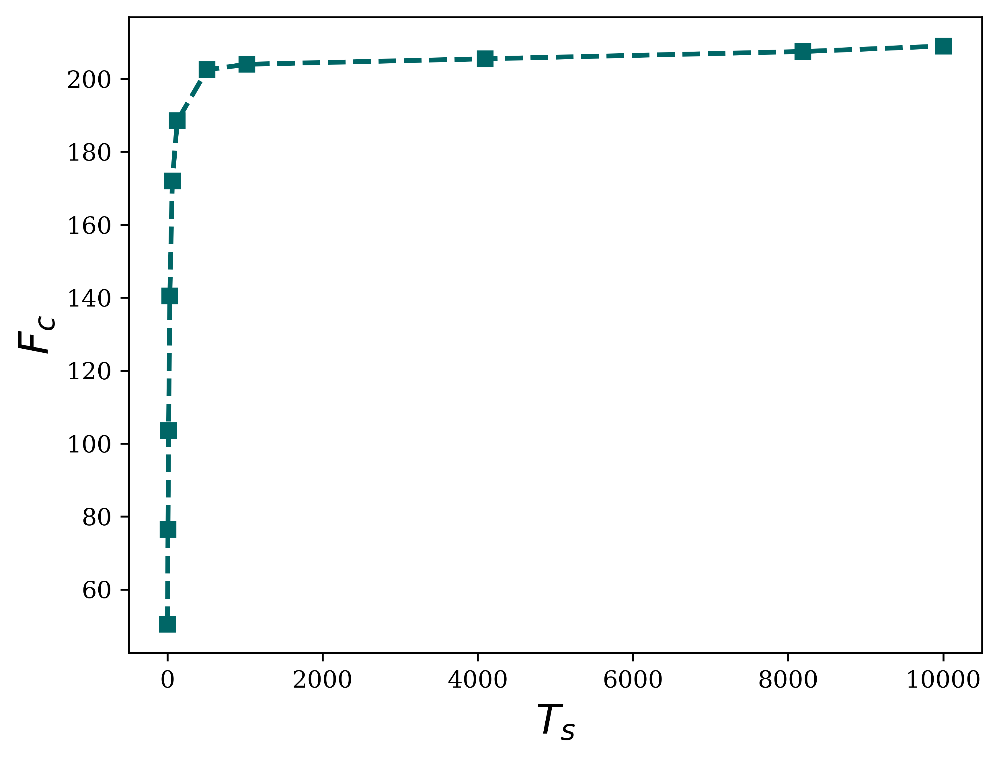

In [21]:
plt.figure(dpi = 600)
plt.plot(Ts,fc,'s--', color='#006666' )
plt.xlabel(r"$T_{s}$")
plt.ylabel(r"$F_{c}$")

NameError: name 'Ts' is not defined

<Figure size 900x900 with 0 Axes>

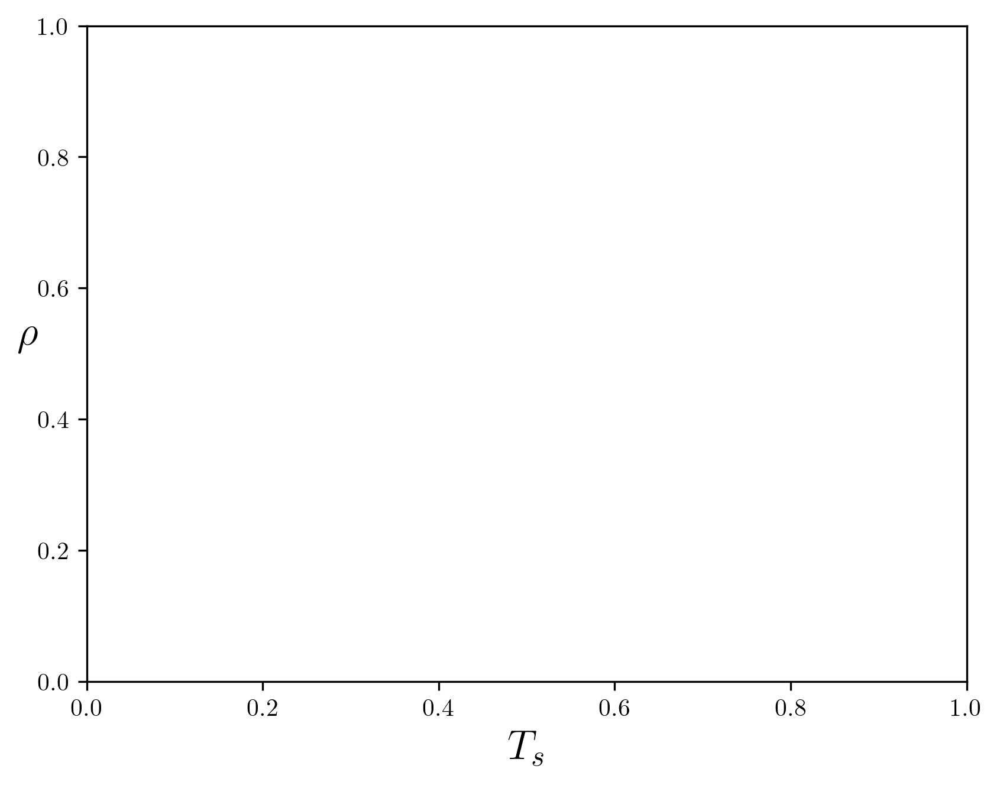

In [11]:
D = []
plt.figure(figsize=(9,9))
plt.figure(dpi=300)
plt.xlabel(r'$T_{s}$')
plt.ylabel(r'$\rho$',rotation = 0)
for ts, df in ts_DFM.items():
    D.append(df['num_particles'].max())
D = np.array(D)
D = D/(201*17*17)
plt.plot(Ts,D, 's--', color = '#006666')
plt.ylim(0.15,0.7)

In [ ]:
D

array([0.17338911, 0.25238858, 0.343077  , 0.57465269, 0.62010019,
       0.65568352, 0.65403088, 0.6629138 , 0.65755995])

In [38]:
# Abrir um arquivo .dat em modo de escrita
with open('stress.dat', 'w') as arquivo:
    # Iterar sobre os elementos das listas
    for item1, item2 in zip(D, sig):
        # Escrever cada par de itens em uma linha, separados por espaço
        arquivo.write(f'{item1} {item2}\n')

In [53]:
plt.figure(dpi=600)
plt.ylabel(r'$F_{c}$')
plt.xlabel(r'$\rho$',rotation = 0)
plt.plot(D,sig,'s', color = 'darksalmon')

alpha, beta, r2 = regressao_linear(D,sig)
yreg = alpha*D+ beta
print(f"Alpha: {alpha}")
print(f"Beta: {beta}")
print(f"R^2: {r2}")
plt.plot(D,yreg,'-', linewidth = '2',  label = fr'${alpha}*\rho {beta}$')
plt.legend(loc = 'best')
#plt.ylim(40,220)


Alpha: 93137206.07766247
Beta: -21025983.13493296
R^2: 0.8924775822628537


Error in callback <function _draw_all_if_interactive at 0x7f15326e6290> (for post_execute), with arguments args (),kwargs {}:


RuntimeError: latex was not able to process the following string:
b'lp'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpijxklhyx d174ba5a1278c3ea3324ab2ddb79f45c.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.

kpathsea: Running mktexfmt latex.fmt
mktexfmt: mktexfmt is using the following fmtutil.cnf files (in precedence order):
mktexfmt: mktexfmt is using the following fmtutil.cnf file for writing changes:
mktexfmt:   /home/robert/.texlive2021/texmf-config/web2c/fmtutil.cnf
mktexfmt [INFO]: writing formats under /home/robert/.texlive2021/texmf-var/web2c
mktexfmt [INFO]: Did not find entry for byfmt=latex skipped
mktexfmt [INFO]: total formats: 0
mktexfmt [INFO]: exiting with status 0
I can't find the format file `latex.fmt'!




RuntimeError: latex was not able to process the following string:
b'lp'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp06up0mer d174ba5a1278c3ea3324ab2ddb79f45c.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.

kpathsea: Running mktexfmt latex.fmt
mktexfmt: mktexfmt is using the following fmtutil.cnf files (in precedence order):
mktexfmt: mktexfmt is using the following fmtutil.cnf file for writing changes:
mktexfmt:   /home/robert/.texlive2021/texmf-config/web2c/fmtutil.cnf
mktexfmt [INFO]: writing formats under /home/robert/.texlive2021/texmf-var/web2c
mktexfmt [INFO]: Did not find entry for byfmt=latex skipped
mktexfmt [INFO]: total formats: 0
mktexfmt [INFO]: exiting with status 0
I can't find the format file `latex.fmt'!




<Figure size 3840x2880 with 1 Axes>

In [18]:
np.mean(D[6:])

0.6569677563738401

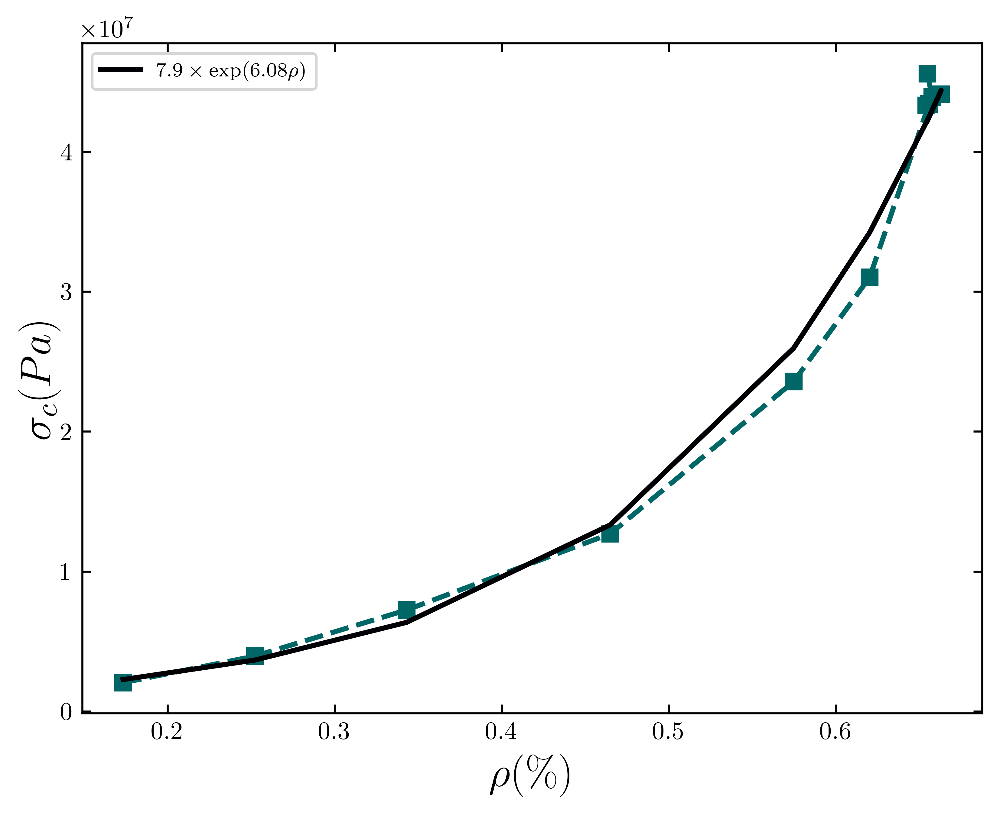

In [26]:
plt.figure(dpi=600)
plt.ylabel(r'$\sigma_{c}(Pa)$', rotation = 90, labelpad =0)
plt.xlabel(r'$\rho(\%)$',rotation = 0)
plt.plot(D,sig,'s--', color = '#006666')

x = np.loadtxt('fit_stress.dat')
plt.plot(x.T[0],x.T[1],'-', linewidth = '2',  label = r'$7.9 \times \exp(6.08 \rho)$')
plt.legend(loc = 'best')
#plt.ylim(40,220)
# Configurar os tracinhos para dentro e desativar os labels superior e direito
plt.tick_params(direction='in', top=True, right=True, labeltop=False, labelright=False)

In [92]:
fc

[50.5, 76.5, 103.5, 140.5, 172.0, 188.5, 202.5, 204.0, 205.5, 207.5, 209.0]

(-2.0, 70.0)

<Figure size 900x900 with 0 Axes>

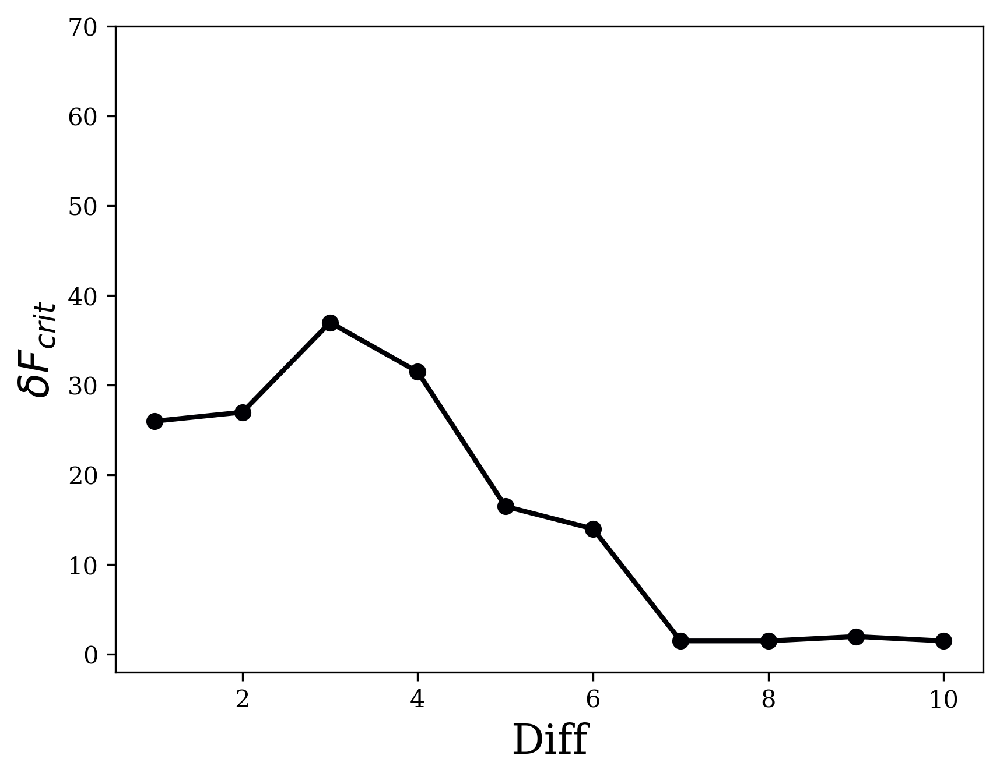

In [91]:
dif = np.diff(fc)
ind = np.arange(1,len(fc))

plt.figure(figsize=(9,9))
plt.figure(dpi=300)
plt.plot(ind, dif, 'o-')
plt.xlabel('Diff')
plt.ylabel(r'$\delta F_{crit}$')
plt.ylim(-2,70)

(40.0, 225.0)

<Figure size 900x900 with 0 Axes>

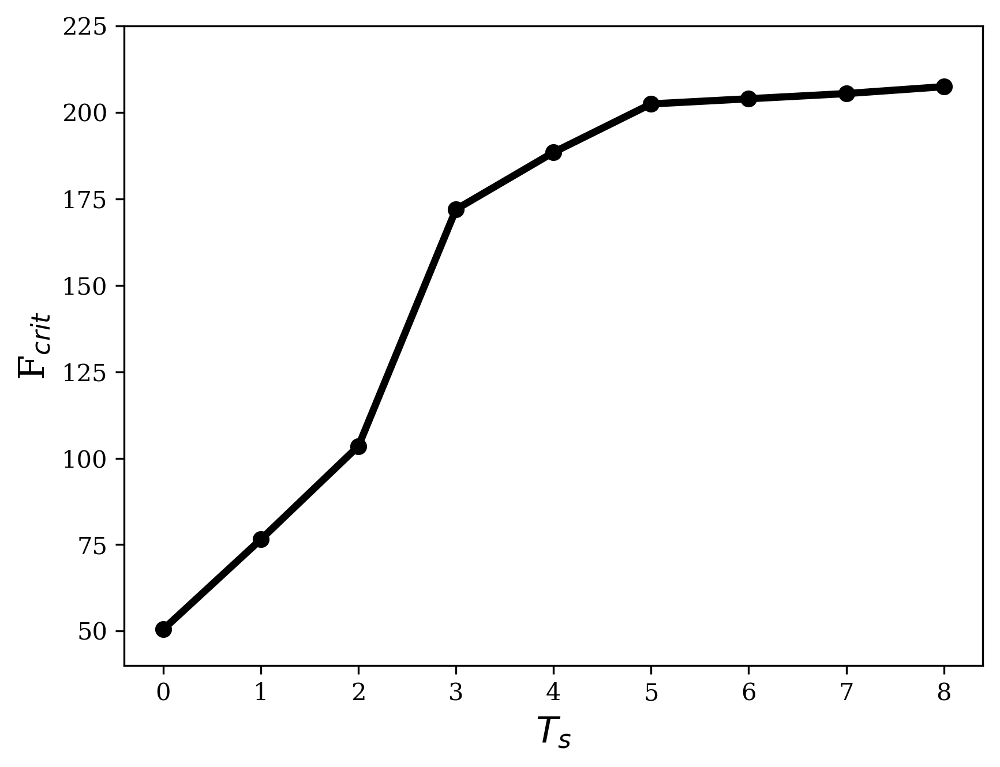

In [19]:
Fm = []
plt.figure(figsize=(9,9))
plt.figure(dpi=300)
plt.xlabel(r'$T_{s}$')
plt.ylabel(r'F$_{crit}$')
for ts, df in ts_DFM.items():
    Fm.append(df['F'].max())

plt.plot(fc, 'o-', color = 'k')
plt.ylim(40,225)

(0.1, 0.7)

<Figure size 900x900 with 0 Axes>

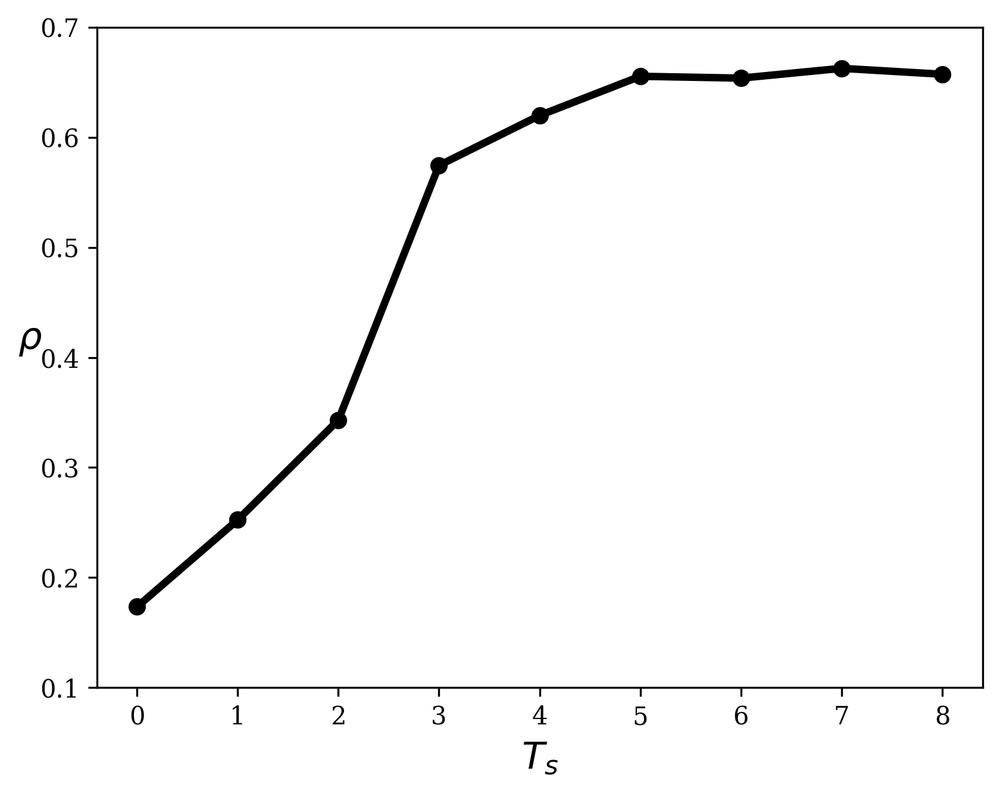

In [ ]:
D = []
plt.figure(figsize=(9,9))
plt.figure(dpi=300)
plt.xlabel(r'$T_{s}$')
plt.ylabel(r'$\rho$',rotation = 0)
for ts, df in ts_DFM.items():
    D.append(df['num_particles'].max())
D = np.array(D)
D = D/(201*17*17)
plt.plot(D, 'o-', color = 'k')
plt.ylim(0.1,0.7)

Alpha: 315.8685967228523
Beta: -4.5039788885185885
R^2: 0.9981432789097932


<Figure size 900x900 with 0 Axes>

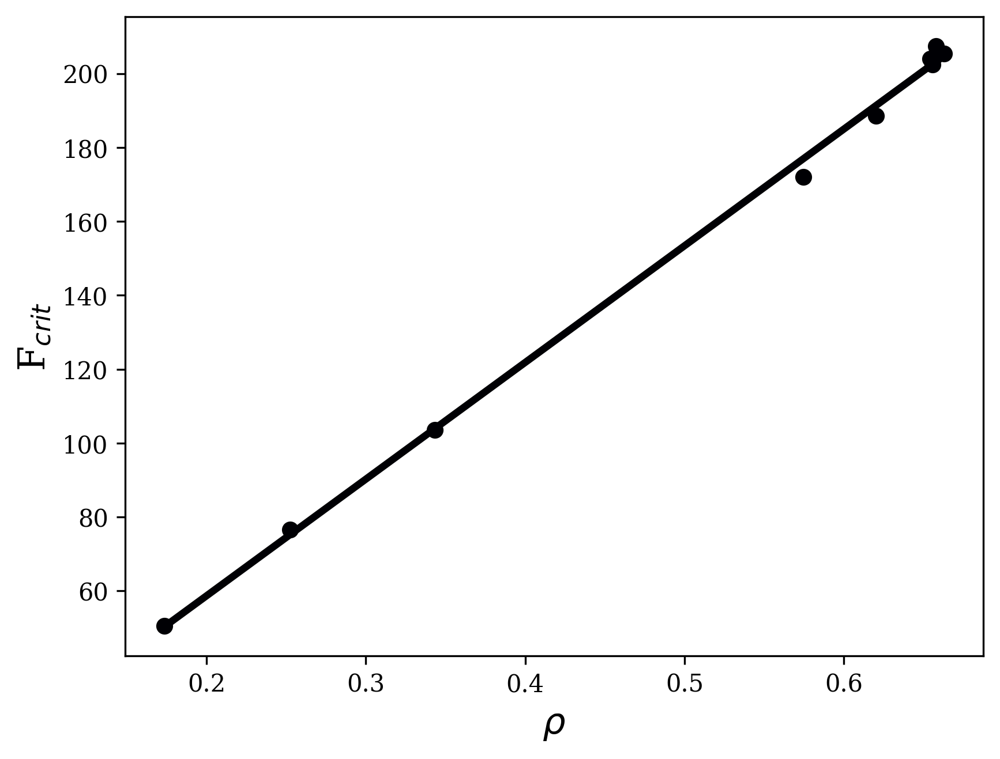

In [ ]:

plt.figure(figsize=(9,9))
plt.figure(dpi=300)
plt.ylabel(r'F$_{crit}$')
plt.xlabel(r'$\rho$')
alpha, beta, r2 = regressao_linear(D,Fm)
yreg = alpha*D+ beta
print(f"Alpha: {alpha}")
print(f"Beta: {beta}")
print(f"R^2: {r2}")
plt.plot(D,yreg)
plt.scatter(D,Fm, marker = 'o')


In [ ]:
wdir = '/home/robert/Documentos/Stress/'
for fn in sorted(os.listdir(wdir)):
    if not fn.endswith('.db'):
        continue

    print(fn)

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
#plt.figure(figsize=(10,10))
markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H']
#plt.ylabel(r'Num. of Removed Particles')
#plt.xlabel(r"$F$")

i = 0
for ts, df in ts_DFM.items():
    x = df['F'].to_numpy()[3:-1]
    
    y = df['num_deleted_rods'].to_numpy()[3:-1]
    x = x[y>1000]
    y = y[y>1000]
    #alpha,beta,r2 = regressao_linear(np.log(x),np.log(y))
    #print(alpha,beta,r2)
    fig.add_trace(go.Scatter(x=x, y=y, mode='markers', name=ts))
    #plt.scatter(, , marker = markers[i], label = ts)
    i+= 1
fig.update_layout(
    template = 'seaborn',
    width = 600,
    height = 600,
    xaxis=dict(title='Eixo X',type = 'log'),
    yaxis=dict(title='Eixo Y', type='log'),  # Escala logarítmica no eixo Y
)
fig.show()
#plt.legend()

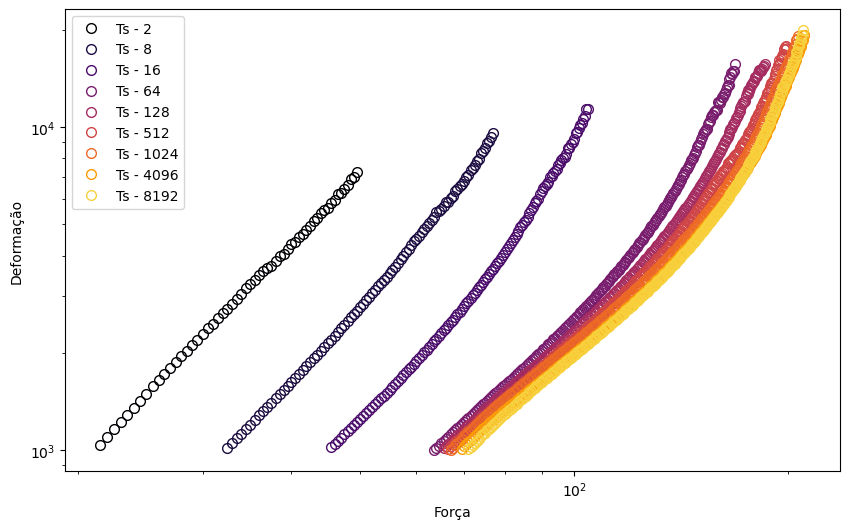

In [ ]:
plt.figure(figsize=(10, 6))
i = 0
for ts, df in ts_DFM.items():
    x = df['F'].to_numpy()[3:-1]
    
    y = df['num_deleted_rods'].to_numpy()[3:-1]
    x = x[y>1000]
    y = y[y>1000]
    #alpha,beta,r2 = regressao_linear(np.log(x),np.log(y))
    #print(alpha,beta,r2)
    plt.plot(x,y,'o',ms=7,markerfacecolor='none',label=f'Ts - {ts}')
    #plt.scatter(, , marker = markers[i], label = ts)
    i+= 1

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Força')
plt.ylabel('Deformação')
plt.legend()
plt.show()

In [ ]:
ts_DFM.items()

dict_items([(2,         F  num_particles  num_deleted_rods  num_particles_norm
0     0.0   10427.400000          0.000000            1.000000
1     0.5   10427.400000          0.000000            1.000000
2     1.0   10427.357333          0.108000            0.999996
3     1.5   10427.168333          0.342000            0.999978
4     2.0   10426.526333          1.164000            0.999916
..    ...            ...               ...                 ...
96   48.0    4599.384413       6633.961471            0.441086
97   48.5    4426.860759       6883.641675            0.424541
98   49.0    4309.866370       6986.766147            0.413321
99   49.5    4100.134689       7264.132147            0.393208
100  49.5       0.000000      10427.400000            0.000000

[101 rows x 4 columns]), (8,         F  num_particles  num_deleted_rods  num_particles_norm
0     0.0   14849.400000          0.000000            1.000000
1     0.5   14849.398333          0.024000            1.000000
2     1.0

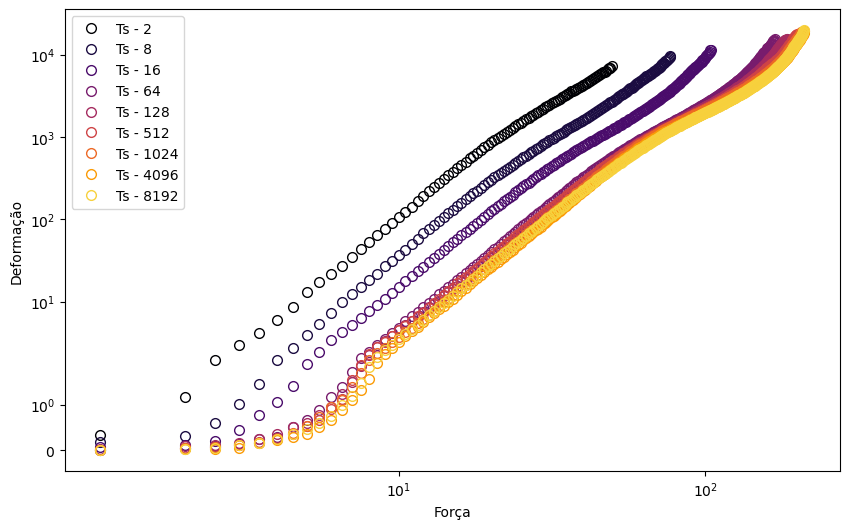

In [ ]:
plt.figure(figsize=(10, 6))
i = 0
for ts, df in ts_DFM.items():
    x = df['F'].to_numpy()[3:-1]
    
    y = df['num_deleted_rods'].to_numpy()[3:-1]
    #x = x[y>1000]
    #y = y[y>1000]
    #alpha,beta,r2 = regressao_linear(np.log(x),np.log(y))
    #print(alpha,beta,r2)
    plt.plot(x,y,'o',ms=7,markerfacecolor='none',label=f'Ts - {ts}')
    #plt.scatter(, , marker = markers[i], label = ts)
    i+= 1
plt.xscale('symlog')
plt.yscale('symlog')
plt.xlabel('Força')
plt.ylabel('Deformação')
plt.legend()
plt.show()

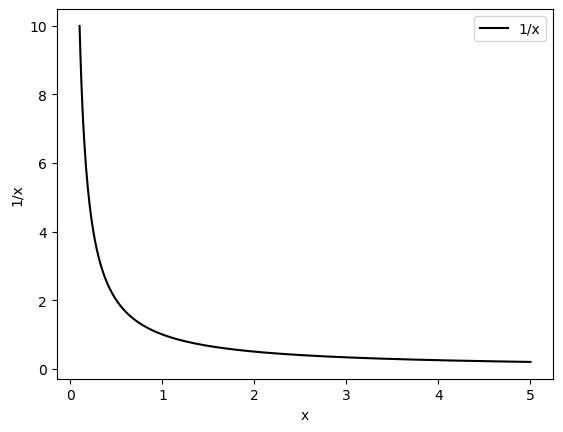

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Cria um intervalo de valores para x (evitando x = 0)
x = np.linspace(0.1, 5, 500)

# Calcula os valores correspondentes de 1/x
y = 1 / x

# Plota o gráfico da função
plt.plot(x, y, label='1/x')

# Adiciona rótulos aos eixos
plt.xlabel('x')
plt.ylabel('1/x')

# Adiciona uma legenda
plt.legend()

# Exibe o gráfico
plt.show()


In [ ]:
pip install -U plotly

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 8.5 MB/s eta 0:00:000m eta 0:00:010:00:01
  Attempting uninstall: plotly
    Found existing installation: plotly 5.15.0
    Uninstalling plotly-5.15.0:
      Successfully uninstalled plotly-5.15.0
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def regressao_linear(x, y):
    # Verifique se as entradas têm o mesmo tamanho
    if len(x) != len(y):
        raise ValueError("As listas de entrada devem ter o mesmo tamanho.")

    # Converta as listas em arrays do numpy
    x = np.array(x).reshape(-1, 1)
    y = np.array(y)

    # Crie um modelo de regressão linear
    modelo = LinearRegression()

    # Treine o modelo
    modelo.fit(x, y)

    # Faça previsões com base no modelo treinado
    y_pred = modelo.predict(x)

    # Calcule o coeficiente de determinação (R²)
    r2 = r2_score(y, y_pred)

    # Retorne os coeficientes da regressão e o R²
    return modelo.coef_[0], modelo.intercept_,r2
    

In [ ]:
best_r2 = 0
best_i = 0
for i in range(30,len(x)):
    alpha, beta, r2 = regressao_linear(x[-i:],y[-i:])
    if(best_r2 > r2):
        r2 = best_r2
        best_i = i

NameError: name 'x' is not defined

In [ ]:
x = np.linspace(0,100,100)
y = np.linspace(0,100,100) * 52
best_r2 = 0

best_i = 0
for i in range(30,len(x)):
    alpha, beta, r2 = regressao_linear(x[-i:],y[-i:])
    if(best_r2 > r2):
        r2 = best_r2
        best_i = i


In [ ]:
best_i

0

In [ ]:
alpha

52.00000000000001

In [ ]:
for ts, df in ts_DFM.items():
    best_r2 = 0
    best_i = 0
    x = df['F'].to_numpy()
    print(x)
    print(x[-30:])

[ 0.   0.5  1.   1.5  2.   2.5  3.   3.5  4.   4.5  5.   5.5  6.   6.5
  7.   7.5  8.   8.5  9.   9.5 10.  10.5 11.  11.5 12.  12.5 13.  13.5
 14.  14.5 15.  15.5 16.  16.5 17.  17.5 18.  18.5 19.  19.5 20.  20.5
 21.  21.5 22.  22.5 23.  23.5 24.  24.5 25.  25.5 26.  26.5 27.  27.5
 28.  28.5 29.  29.5 30.  30.5 31.  31.5 32.  32.5 33.  33.5 34.  34.5
 35.  35.5 36.  36.5 37.  37.5 38.  38.5 39.  39.5 40.  40.5 41.  41.5
 42.  42.5 43.  43.5 44.  44.5 45.  45.5 46.  46.5 47.  47.5 48.  48.5
 49.  49.5 49.5]
[35.5 36.  36.5 37.  37.5 38.  38.5 39.  39.5 40.  40.5 41.  41.5 42.
 42.5 43.  43.5 44.  44.5 45.  45.5 46.  46.5 47.  47.5 48.  48.5 49.
 49.5 49.5]
[ 0.   0.5  1.   1.5  2.   2.5  3.   3.5  4.   4.5  5.   5.5  6.   6.5
  7.   7.5  8.   8.5  9.   9.5 10.  10.5 11.  11.5 12.  12.5 13.  13.5
 14.  14.5 15.  15.5 16.  16.5 17.  17.5 18.  18.5 19.  19.5 20.  20.5
 21.  21.5 22.  22.5 23.  23.5 24.  24.5 25.  25.5 26.  26.5 27.  27.5
 28.  28.5 29.  29.5 30.  30.5 31.  31.5 32.  32.5

In [ ]:
reg_stress = []
for ts, df in ts_DFM.items():
    best_r2 = 0
    best_i = 0
    x = df['F'].to_numpy()
    y = df['num_deleted_rods'].to_numpy()
    for i in range(30,len(x)):
        alpha, beta, r2 = regressao_linear(x[-i:],y[-i:])
        
        if(best_r2 < r2):
            best_r2 = r2

            best_i = i
            print(r2)
            print(best_i)

    reg_stress.append([r2, x[-best_i:],alpha*x[-best_i:]])

0.8347876755217664
30
0.8410364009367038
31
0.8469540782902522
32
0.8530665264319344
33
0.8589248052125055
34
0.8644546351318967
35
0.8695414536948457
36
0.8741136614129259
37
0.8785247224831332
38
0.8827746546556133
39
0.8865828965679602
40
0.8901945192863597
41
0.8936629468917867
42
0.8968663235406629
43
0.8997982179075769
44
0.9025449301324914
45
0.9050958236533538
46
0.9074054192650421
47
0.9095420300212627
48
0.9115191280962296
49
0.9133644873881256
50
0.9151312278330717
51
0.9167602562564292
52
0.9182792076530322
53
0.9196577571069198
54
0.9208965217908667
55
0.922005369855834
56
0.9230072885835824
57
0.9238914788800284
58
0.9246889943643348
59
0.9254041505556864
60
0.9260259686655226
61
0.9265875454398608
62
0.9270702325181136
63
0.9274752859618648
64
0.9278069613276765
65
0.9280692730410213
66
0.9282378274209947
67
0.9283497916691322
68
0.9283656274664532
69
0.7284021460913259
30
0.7364676722331908
31
0.7444129431151497
32
0.7521181494084913
33
0.759762533898964
34
0.7673229539

In [ ]:
reg_stress[1][1]

array([ 0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,
        6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. , 10.5, 11. ,
       11.5, 12. , 12.5, 13. , 13.5, 14. , 14.5, 15. , 15.5, 16. , 16.5,
       17. , 17.5, 18. , 18.5, 19. , 19.5, 20. , 20.5, 21. , 21.5, 22. ,
       22.5, 23. , 23.5, 24. , 24.5, 25. , 25.5, 26. , 26.5, 27. , 27.5,
       28. , 28.5, 29. , 29.5, 30. , 30.5, 31. , 31.5, 32. , 32.5, 33. ,
       33.5, 34. , 34.5, 35. , 35.5, 36. , 36.5, 37. , 37.5, 38. , 38.5,
       39. , 39.5, 40. , 40.5, 41. , 41.5, 42. , 42.5, 43. , 43.5, 44. ,
       44.5, 45. , 45.5, 46. , 46.5, 47. , 47.5, 48. , 48.5, 49. , 49.5,
       50. , 50.5, 51. , 51.5, 52. , 52.5, 53. , 53.5, 54. , 54.5, 55. ,
       55.5, 56. , 56.5, 57. , 57.5, 58. , 58.5, 59. , 59.5, 60. , 60.5,
       61. , 61.5, 62. , 62.5, 63. , 63.5, 64. , 64.5, 65. , 65.5, 66. ,
       66.5, 67. , 67.5, 68. , 68.5, 69. , 69.5, 70. , 70.5, 71. , 71.5,
       72. , 72.5, 73. , 73.5, 74. , 74.5, 75. , 75

2.722912347982714 -2.658641927864993 0.9964824100602669


/tmp/ipykernel_130643/909105118.py:21: RuntimeWarning: divide by zero encountered in log
  plt.scatter(np.log(df['F'].to_numpy()[:-1]), np.log(df['num_deleted_rods'].to_numpy()[:-1]), marker = markers[0], label = ts)


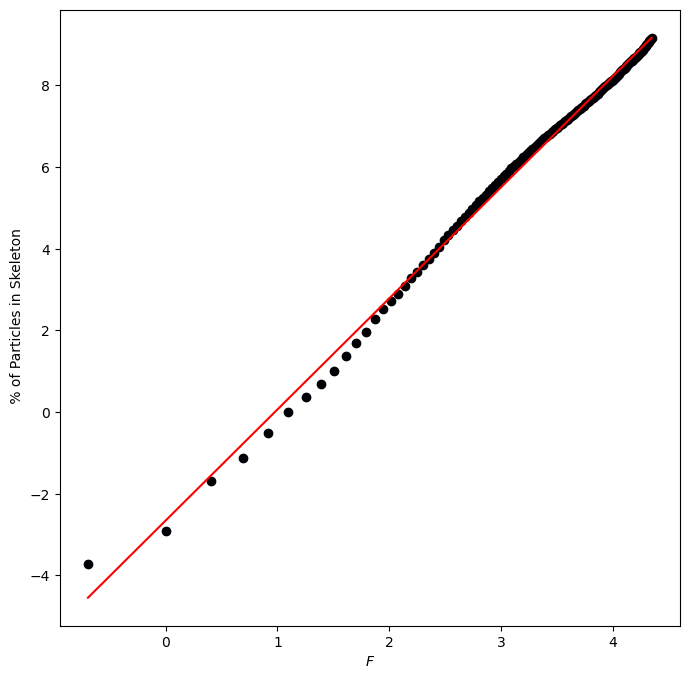

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

plt.figure(figsize=(8,8))
markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H']
plt.ylabel(r' % of Particles in Skeleton')
plt.xlabel(r"$F$")

df = ts_DFM[8]

best_r2 = 0
best_i = 0
x = df['F'].to_numpy()
y = df['num_deleted_rods'].to_numpy()
for i in range(100,len(x)):
    alpha, beta, r2 = regressao_linear(x[-i:],y[-i:])
    if(best_r2 < r2):
        
        best_r2 = r2
        best_i = i
        #print(r2)
plt.scatter(np.log(df['F'].to_numpy()[:-1]), np.log(df['num_deleted_rods'].to_numpy()[:-1]), marker = markers[0], label = ts)
x = np.array(df['F'].to_numpy()[:-1])
y = np.array(df['num_deleted_rods'].to_numpy()[:-1])
x = x[1:]
y = y[1:]
alpha, beta, r2 = regressao_linear(np.log(x),np.log(y))
plt.plot(np.log(x), alpha*np.log(x)+beta,c = 'red')
print(alpha,beta,r2)
plt.show()

In [ ]:
ts_DFM.items()

TypeError: 'dict_items' object is not subscriptable

In [ ]:
import matplotlib.pyplot as plt

plt.rc('axes', titlesize=25)
plt.rc('axes', labelsize=25)
plt.rc('lines', markersize=12)
plt.rc('lines', linewidth=4)
plt.rc('legend', loc='best')
plt.rc('legend', fontsize=21)
plt.rc('xtick', labelsize=21)
plt.rc('ytick', labelsize=21)


/tmp/ipykernel_130643/313913741.py:10: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(df['F'].to_numpy()[1:-1]), np.log10(df['num_deleted_rods'].to_numpy()[1:-1]), marker = markers[i], label = ts)


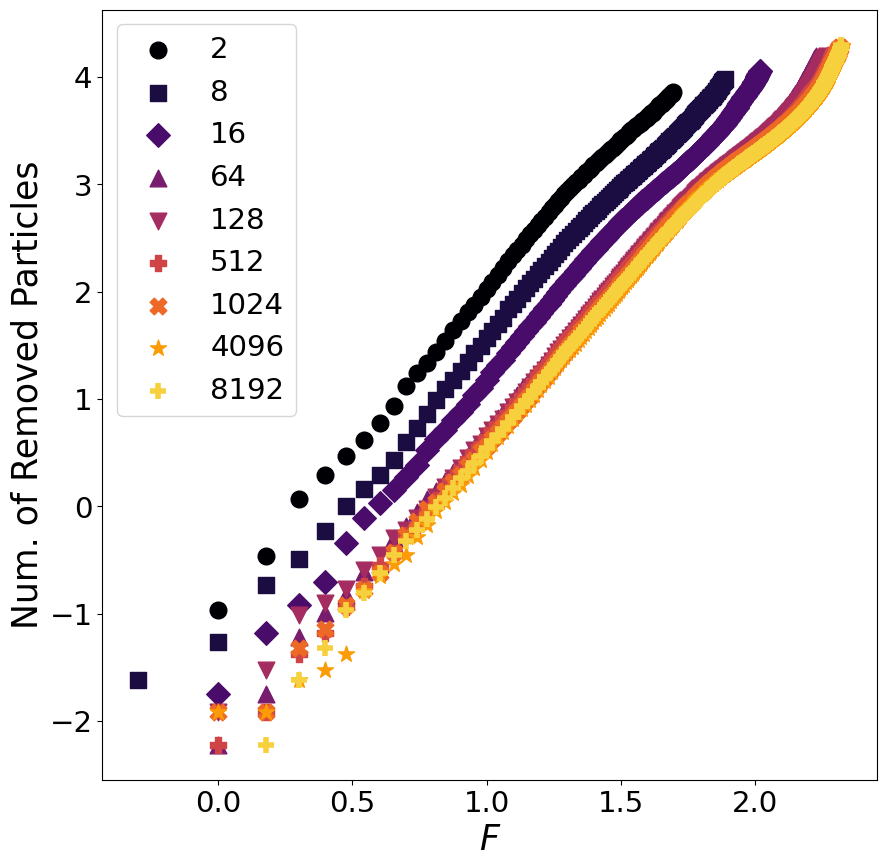

In [ ]:
plt.figure(figsize=(10,10))


markers = ['o', 's', 'D', '^', 'v', 'P', 'X', '*', '+', 'H']
plt.ylabel(r'Num. of Removed Particles')
plt.xlabel(r"$F$")

i = 0
for ts, df in ts_DFM.items():
    plt.scatter(np.log10(df['F'].to_numpy()[1:-1]), np.log10(df['num_deleted_rods'].to_numpy()[1:-1]), marker = markers[i], label = ts)
    #plt.plot(reg_stress[i][1], reg_stress[i][2])
    i+= 1

    if i == 9:
        break

plt.legend()

In [ ]:
reg_stress

[[2,
  0,
  array([11188.6561903 , 11346.24289721, 11503.82960411, 11661.41631102,
         11819.00301792, 11976.58972483, 12134.17643173, 12291.76313864,
         12449.34984555, 12606.93655245, 12764.52325936, 12922.10996626,
         13079.69667317, 13237.28338007, 13394.87008698, 13552.45679388,
         13710.04350079, 13867.6302077 , 14025.2169146 , 14182.80362151,
         14340.39032841, 14497.97703532, 14655.56374222, 14813.15044913,
         14970.73715604, 15128.32386294, 15285.91056985, 15443.49727675,
         15601.08398366, 15601.08398366])],
 [2,
  0,
  array([10833.38066969, 10988.14325069, 11142.90583168, 11297.66841268,
         11452.43099368, 11607.19357467, 11761.95615567, 11916.71873666,
         12071.48131766, 12226.24389865, 12381.00647965, 12535.76906065,
         12690.53164164, 12845.29422264, 13000.05680363, 13154.81938463,
         13309.58196562, 13464.34454662, 13619.10712761, 13773.86970861,
         13928.63228961, 14083.3948706 , 14238.1574516 , 143

In [ ]:
for ts in tqdm(sorted(ts_DF)):
    ts_DF[ts] = ts_DF[ts].groupby('F').mean().reset_index()

ts_DF

100%|██████████| 10/10 [00:00<00:00, 32.32it/s]


{1024:          F  num_particles  num_deleted_rods
 0      0.0      38290.800          0.000000
 1      0.5      38290.800          0.000000
 2      1.0      38290.795          0.000667
 3      1.5      38290.795          0.000667
 4      2.0      38290.786          0.002667
 ..     ...            ...               ...
 438  219.0      23558.600       1355.000000
 439  219.5      21943.000       1786.500000
 440  220.0      21451.500       1218.000000
 441  220.5      19508.000       1740.500000
 442  221.0      20510.000       2409.000000
 
 [443 rows x 3 columns],
 128:          F  num_particles  num_deleted_rods
 0      0.0   35604.600000          0.000000
 1      0.5   35604.600000          0.000000
 2      1.0   35604.599333          0.000667
 3      1.5   35604.587000          0.001667
 4      2.0   35604.577333          0.005333
 ..     ...            ...               ...
 402  201.0   19376.272727       1578.636364
 403  201.5   18262.166667       1428.333333
 404  202.0   220

In [ ]:
ts_df[1024]


[         F  num_particles  num_deleted_rods
 0      0.0          36334                 0
 1      0.5          36334                 0
 2      1.0          36334                 0
 3      1.5          36334                 0
 4      2.0          36334                 0
 ..     ...            ...               ...
 384  192.0          26681               704
 385  192.5          26418               720
 386  193.0          25967               746
 387  193.5          24971               802
 388  194.0          24584              2194
 
 [389 rows x 3 columns],
          F  num_particles  num_deleted_rods
 0      0.0          36334                 0
 1      0.5          36334                 0
 2      1.0          36334                 0
 3      1.5          36334                 0
 4      2.0          36334                 0
 ..     ...            ...               ...
 368  184.0          26340               725
 369  184.5          26165               735
 370  185.0          26044  

In [ ]:
dfA = {'name':[], 'F':[], 'num_particles':[]}
for i in tqdm(range(len(DF['ts']))):
    ts = DF['ts'][i]
    if ts != 2:
        continue
    k = DF['k'][i]
    seed = DF['seed'][i]
    df = DF['df'][i]
    name = f'{k}_{seed}'
    n = len(df)
    dfA['name'].extend(n * [name])
    dfA['F'].extend(df['F'].to_list())
    dfA['num_particles'].extend(df['num_particles'].to_list())
    
# convert to dataframe
dfA = pd.DataFrame(dfA)


  0%|          | 0/30000 [00:00<?, ?it/s]

100%|██████████| 30000/30000 [00:00<00:00, 76433.32it/s] 


In [ ]:
dfA


,name,F,num_particles
0,0_325,0.0,11450
1,0_325,0.5,11450
2,0_325,1.0,11450
3,0_325,1.5,11450
4,0_325,2.0,11450
...,...,...,...
275017,99_715,36.5,6165
275018,99_715,37.0,6165
275019,99_715,37.5,6129
275020,99_715,38.0,6129


In [ ]:
def groupby_ts(DF, agg='mean'):
    DF_agg = {}
    for i in range(len(DF['ts'])):
        ts = DF['ts'][i]
        df = DF['df'][i]
        print(df.columns)
        
        if ts not in DF_agg:
            
            DF_agg[ts] = []
        DF_agg[ts].append(df)
    # aggregate
    for ts in DF_agg:
        DF_agg[ts] = pd.concat(DF_agg[ts])
        if agg == 'mean':
            DF_agg[ts] = DF_agg[ts].groupby('F').mean().reset_index()
        elif agg == 'count':
            DF_agg[ts] = DF_agg[ts].groupby('F').count().reset_index()
        else:
            raise ValueError(f'agg={agg} not supported')
    return DF_agg

In [ ]:
DF_agg = groupby_ts(DF, agg='count')
DF_agg

Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F', 'num_particles', 'num_deleted_rods'], dtype='object')
Index(['F'

{1024:          F  num_particles  num_deleted_rods
 0      0.0           3000              3000
 1      0.5           3000              3000
 2      1.0           3000              3000
 3      1.5           3000              3000
 4      2.0           3000              3000
 ..     ...            ...               ...
 438  219.0              5                 5
 439  219.5              4                 4
 440  220.0              2                 2
 441  220.5              2                 2
 442  221.0              1                 1
 
 [443 rows x 3 columns],
 128:          F  num_particles  num_deleted_rods
 0      0.0           3000              3000
 1      0.5           3000              3000
 2      1.0           3000              3000
 3      1.5           3000              3000
 4      2.0           3000              3000
 ..     ...            ...               ...
 402  201.0             11                11
 403  201.5              6                 6
 404  202.0      

In [ ]:
DF_agg = groupby_ts(DF, agg='count')

dfA = {'ts':[], 'F':[], 'num_particles':[]}
for ts in DF_agg:
    df = DF_agg[ts]
    print(df)

    # normalize
    df['num_particles'] = df['num_particles'] / df['num_particles'].max()
    dfA['ts'].extend(len(df) * [ts])
    dfA['F'].extend(df['F'].values) # type: ignore
    dfA['num_particles'].extend(df['num_particles'].values) # type: ignore

dfA = pd.DataFrame(dfA)
dfA.sort_values(by=['ts', 'F'], inplace=True)
dfA


         F  num_particles  num_deleted_rods
0      0.0           3000              3000
1      0.5           3000              3000
2      1.0           3000              3000
3      1.5           3000              3000
4      2.0           3000              3000
..     ...            ...               ...
438  219.0              5                 5
439  219.5              4                 4
440  220.0              2                 2
441  220.5              2                 2
442  221.0              1                 1

[443 rows x 3 columns]
         F  num_particles  num_deleted_rods
0      0.0           3000              3000
1      0.5           3000              3000
2      1.0           3000              3000
3      1.5           3000              3000
4      2.0           3000              3000
..     ...            ...               ...
402  201.0             11                11
403  201.5              6                 6
404  202.0              4                 4
405  202

,ts,F,num_particles
1510,2,0.0,1.000000
1511,2,0.5,1.000000
1512,2,1.0,1.000000
1513,2,1.5,1.000000
1514,2,2.0,1.000000
...,...,...,...
1275,16384,212.5,0.002000
1276,16384,213.0,0.001000
1277,16384,213.5,0.000667
1278,16384,214.0,0.000333


In [ ]:
# Encontre os índices das linhas onde 'num_part' < 0.25
indices_linhas = dfA["F"][dfA['num_particles'] < 0.25]

indices_linhas

1610     50.0
1611     50.5
1612     51.0
1613     51.5
1614     52.0
        ...  
1275    212.5
1276    213.0
1277    213.5
1278    214.0
1279    214.5
Name: F, Length: 278, dtype: float64

In [ ]:
dfts = df.values()
dfts


dict_values([         F  num_particles  num_deleted_rods
0      0.0      38290.800          0.000000
1      0.5      38290.800          0.000000
2      1.0      38290.795          0.000667
3      1.5      38290.795          0.000667
4      2.0      38290.786          0.002667
..     ...            ...               ...
438  219.0      23558.600       1355.000000
439  219.5      21943.000       1786.500000
440  220.0      21451.500       1218.000000
441  220.5      19508.000       1740.500000
442  221.0      20510.000       2409.000000

[443 rows x 3 columns],          F  num_particles  num_deleted_rods
0      0.0   35604.600000          0.000000
1      0.5   35604.600000          0.000000
2      1.0   35604.599333          0.000667
3      1.5   35604.587000          0.001667
4      2.0   35604.577333          0.005333
..     ...            ...               ...
402  201.0   19376.272727       1578.636364
403  201.5   18262.166667       1428.333333
404  202.0   22018.750000       1038.2

In [ ]:
dfts

<function dict.values>

In [ ]:
def plot_F_vs_num_particles(DF):
    DF_agg = groupby_ts(DF, agg='mean')
    # mean number of particles for each force
    dfA = {'ts':[], 'F':[], 'num_particles':[]}
    for ts in DF_agg:
        df = DF_agg[ts]
        # normalize
        df['num_particles'] = df['num_particles'] / df['num_particles'].max()
        dfA['ts'].extend(len(df) * [ts])
        dfA['F'].extend(df['F'].values) # type: ignore
        dfA['num_particles'].extend(df['num_particles'].values) # type: ignore

    dfA = pd.DataFrame(dfA)
    dfA.sort_values(by=['ts', 'F'], inplace=True)
    fig = px.line(dfA, x='F', y='num_particles', color='ts', title='F vs num_particles')
    # resize figure
    fig.update_layout(
        autosize=False,
        width=800,
        height=600,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
        ),
        # paper_bgcolor="LightSteelBlue",
    )
    fig.show()


In [ ]:
plot_F_vs_num_particles(DF)

In [ ]:
# count number of particles for each force
DF_agg = groupby_ts(DF, agg='count')

# mean number of particles for each force
dfA = {'ts':[], 'F':[], 'sample_size':[]}
for ts in DF_agg:
    df = DF_agg[ts]
    # normalize
    df['num_particles'] = df['num_particles'] / df['num_particles'].max()
    dfA['ts'].extend(len(df) * [ts])
    dfA['F'].extend(df['F'].values) # type: ignore
    dfA['sample_size'].extend(df['num_particles'].values) # type: ignore

dfA = pd.DataFrame(dfA)
dfA.sort_values(by=['ts', 'F'], inplace=True)

fig = px.line(dfA, x='F', y='sample_size', color='ts', title='F vs sample_size')
# resize figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    # paper_bgcolor="LightSteelBlue",
)
fig.show()


In [ ]:
import matplotlib.pyplot as plt
# count number of particles for each force
DF_agg = groupby_ts(DF, agg='count')

# mean number of particles for each force
dfA = {'ts':[], 'F':[], 'sample_size':[]}
for ts in DF_agg:
    df = DF_agg[ts]
    # normalize
    df['num_particles'] = df['num_particles'] / df['num_particles'].max()
    dfA['ts'].extend(len(df) * [ts])
    dfA['F'].extend(df['F'].values) # type: ignore
    dfA['sample_size'].extend(df['num_particles'].values) # type: ignore



dfA = pd.DataFrame(dfA)
dfA.sort_values(by=['ts', 'F'], inplace=True)
display(dfA)

x = dfA['F'].tolist()

y = dfA['simple_size'].tolist()

plt.Figure(figsize=(14,14))

plt.plot(x, y, label=f'ts={ts}', linewidth = 4,linestyle='dashed')


plt.xlabel('Force',fontdict=fontlabel)
plt.ylabel('Particles in skeleton',fontdict=fontlabel)
plt.legend( loc = 'upper right',prop=fontlegend)
plt.xticks(size = 20, family = 'serif', weight = 'normal')
plt.yticks(size = 20, family = 'serif', weight = 'normal')
plt.tick_params(direction = 'in',bottom = True, top= True, left= True, right= True )
#plt.grid(True)
plt.tight_layout()
plt.show()


,ts,F,sample_size
1510,2,0.0,1.000000
1511,2,0.5,1.000000
1512,2,1.0,1.000000
1513,2,1.5,1.000000
1514,2,2.0,1.000000
...,...,...,...
1275,16384,212.5,0.002000
1276,16384,213.0,0.001000
1277,16384,213.5,0.000667
1278,16384,214.0,0.000333


KeyError: 'simple_size'

In [ ]:
## new def

import matplotlib.pyplot as plt

def plot_F_vs_num_particles(DF):
    DF_agg = groupby_ts(DF, agg='mean')
    # mean number of particles for each force
    dfA = {'ts': [], 'F': [], 'num_particles': []}
    for ts in DF_agg:
        df = DF_agg[ts]
        #display(df)

        # normalize
        
        #df['num_particles'] = df['num_particles'] / df['num_particles'].max()
        dfA['ts'].extend(len(df) * [ts])
        dfA['F'].extend(df['F'].values) # type: ignore
        dfA['num_particles'].extend(df['num_particles'].values) # type: ignore
        


    dfA = pd.DataFrame(dfA)
    dfA.sort_values(by=['ts', 'F'], inplace=True)
    
    plt.figure(figsize=(14,14))
    # Create a separate line plot for each ts value
    unique_ts = dfA['ts'].unique()
    for ts in unique_ts[:9]:
        subset = dfA[dfA['ts'] == ts]
        #print(type(subset['F']))
        x = subset['F'].tolist()
        x.append(x[-1])
        y = subset['num_particles'].tolist()

        y.append(0)
        norm = [x / y[0] for x in y]
        plt.plot(x, norm, label=f'ts={ts}', linewidth = 4,linestyle='dashed')


    plt.xlabel('Force',fontdict=fontlabel)
    plt.ylabel('% particles in skeleton',fontdict=fontlabel)
    plt.legend( loc = 'upper right',prop=fontlegend)
    plt.xticks(size = 20, family = 'serif', weight = 'normal')
    plt.yticks(size = 20, family = 'serif', weight = 'normal')
    plt.tick_params(direction = 'in',bottom = True, top= True, left= True, right= True )
    #plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14,14))
    for ts in unique_ts[:9]:
        subset = dfA[dfA['ts'] == ts]
        #print(type(subset['F']))
        x = subset['F'].tolist()
        #x.append(x[-1])
        y = subset['num_particles'].tolist()
        #y.append(0)
        removed = [y[0] - x for x in y[:]]

        plt.plot(x, removed, label=f'ts={ts}', linewidth = 4,linestyle='dashed')


    plt.xlabel('Force',fontdict=fontlabel)
    plt.ylabel('Num. of broken bonds',fontdict=fontlabel)
    plt.legend( loc = 'best',prop=fontlegend)
    plt.xticks(size = 20, family = 'serif', weight = 'normal')
    plt.yticks(size = 20, family = 'serif', weight = 'normal')
    plt.tick_params(direction = 'in',bottom = True, top= True, left= True, right= True )
    #plt.grid(True)
    plt.tight_layout()
    plt.show()

In [ ]:
DF_agg = groupby_ts(DF, agg='count')
F_MAX = {}
for ts in DF_agg:    
    df = DF_agg[ts]
    min_count = 0.25 * df['num_particles'].max()
    F_MAX[ts] = df[df['num_particles'] >= min_count]['F'].max()

print('F_MAX:', F_MAX)

DF_threshold = {col:[] for col in DF}
for i in range(len(DF['ts'])):
    df = DF['df'][i]
    ts = DF['ts'][i]
    f_max = F_MAX[ts]
    for col in DF: # type: ignore
        if col == 'df':
            continue
        DF_threshold[col].append(DF[col][i])
    DF_threshold['df'].append(df[df['F'] <= f_max])

plot_F_vs_num_particles(DF_threshold)

KeyError: 'num_particles'